In [1]:
!which python

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/bin/python


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from cicada.utils import data
from cicada.utils import models
from cicada.utils import visualisation as viz
from cicada import training
from cicada import agent

In [4]:
from kaggle_environments.envs.football.helpers import human_readable_agent
from kaggle_environments import make

In [5]:
import numpy as np
import pandas as pd
from ipywidgets import interact
from copy import deepcopy
from tqdm.notebook import tqdm
import seaborn as sns
import json
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [6]:
import lightgbm as lgb
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV, RidgeClassifierCV
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
import joblib

In [7]:
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

# Single game with diagnostics

In [8]:
# agent = SimpleAgent()
agent.plans.models.reload_lgb_models_if_needed()
agent_obj = agent.Agent()

# Set up the Environment.
env = make("football", configuration={
    "save_video": True, 
    "scenario_name": "11_vs_11_kaggle",
#     "scenario_name": "academy_counterattack_hard",
#     "scenario_name": "academy_run_to_score_with_keeper", 
    "running_in_notebook": True,
#     "episodeSteps": 1000,
})

trainer = env.train([None, "submission2.py"])
obs = trainer.reset()
while not env.done:
#     import pdb; pdb.set_trace()
    action = agent_obj.action_wrapper(obs)
    obs, reward, done, info = trainer.step(action)

env.render(mode="human", width=800, height=600)

/Users/liamkirwin/repo/cicada/cicada/utils/calculation.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  slope_a = (opp_a[1] - pos[1]) / (opp_a[0] - pos[0])
/Users/liamkirwin/repo/cicada/cicada/utils/calculation.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  slope_b = (opp_b[1] - pos[1]) / (opp_b[0] - pos[0])


In [9]:
fig = viz.make_figure_widget(20)

In [10]:
@interact(view_step=(0, len(env.steps) - 2))
def interactive_display(view_step=0):
    step = deepcopy(env.steps[view_step])
    log_step = agent_obj.state.log[view_step]
    state = data.State(data.step_to_obs(step))
    fig.update(data=viz.get_traces(state, log_step))
    viz.print_diagnostics(state, log_step)
fig

interactive(children=(IntSlider(value=0, description='view_step', max=3000), Output()), _dom_classes=('widget-…

FigureWidget({
    'data': [{'fillcolor': 'rgba(0,0,0,0)',
              'hoverinfo': 'text',
              'm…

In [ ]:
stop

In [16]:
data.filter_log(agent_obj.state.log, type=("SHORT_PASS_ATTEMPT", "NEW_POSSESSION"))

[[{'type': 'NEW_POSSESSION', 'player': 8, 'step': 14}],
 [{'type': 'NEW_POSSESSION', 'player': 4, 'step': 73}],
 [{'type': 'NEW_POSSESSION', 'player': 2, 'step': 148}],
 [{'type': 'NEW_POSSESSION', 'player': 6, 'step': 160}],
 [{'type': 'NEW_POSSESSION', 'player': 9, 'step': 179}],
 [{'type': 'SHORT_PASS_ATTEMPT',
   'player': 10,
   'pos_score_data': {'posx': 0.0016483068466186523,
    'posy': 0.2649546165484935,
    'dnet': 1.0329119285072579,
    'view': 0.10479878559666278,
    'dopp': 0.07605384480435672,
    'score': 22.89188114297545},
   'eval_data': {'pass_error': 10.380259475470451,
    'pass_error_diff': 8.57831323006196,
    'pos_offside': 0.0,
    'small_cone_angle': 5.046609357153585,
    'pass_distance': 0.4188291551660166,
    'opp_dist_to_line': 0.03268810768307673,
    'opp_dist_to_active': 0.04264733202278315,
    'prb_success': 0.7284217919879771},
   'queued_at': 189,
   'step': 198}],
 [{'type': 'SHORT_PASS_ATTEMPT',
   'player': 10,
   'pos_score_data': {'posx': 

In [ ]:
data.filter_log(agent_obj.state.log, type=("MOVE_WITH_BALL_ATTEMPT", "LOST_POSSESSION"))

In [ ]:
viz.filter_log(agent_obj.state.log, type=("ACTIVE_POS_SCORE"))

# Many games

- 2020-11-03: trial for lgbm vs. linear for move/pass models, 100 games each, started at 4110
    - lgbm was better
- 2020-11-04: trial for breakaway vs. no breakaway, 100 games each, started at 5510
    - breakaway was better
- 2020-11-04: trial for ridge vs. lgbm for move/pass, 100 games each, started at 5710
    - lgbm very slightly
- 2020-11-04: trial for risk aversion 1.0 vs 1.5, 100 games each, started at 5810
    - 1.5 was much worse

In [11]:
scores = data.get_score_file_as_df()
scores.shape

(6676, 4)

In [12]:
scores.describe()

,left_score,right_score,win,tie
count,6676.000000,6676.000000,6676.000000,6676.000000
mean,1.951318,1.189485,0.558268,0.210905
std,1.363801,1.076497,0.496630,0.407981
min,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000
50%,2.000000,1.000000,1.000000,0.000000
75%,3.000000,2.000000,1.000000,0.000000
max,8.000000,8.000000,1.000000,1.000000


<AxesSubplot:title={'center':'right_score'}>

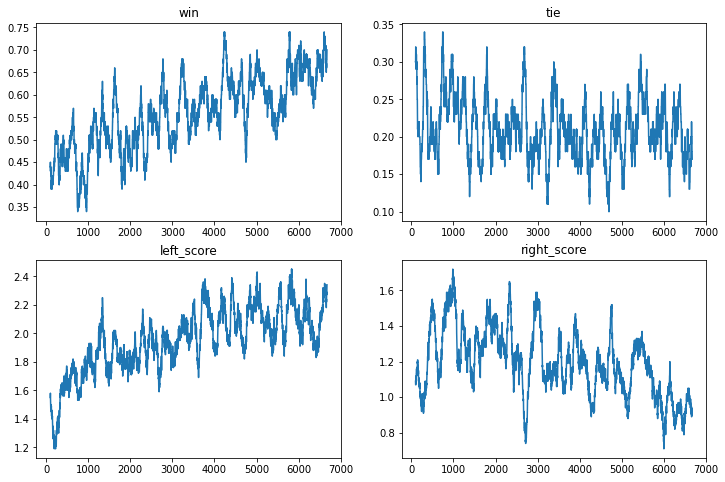

In [13]:
su = scores.rolling(100).mean()
f, axes = plt.subplots(2, 2, figsize=(12, 8))
su.win.plot(ax=axes[0][0], title="win")
su.tie.plot(ax=axes[0][1], title="tie")
su.left_score.plot(ax=axes[1][0], title="left_score")
su.right_score.plot(ax=axes[1][1], title="right_score")

## Shot data

In [ ]:
shots = sim.make_shot_dataset()
shots.shape

In [ ]:
shots.head()

In [ ]:
shots.describe()

In [ ]:
shots.groupby(shots["eval_data.dist_to_goalie"].notna()).success.mean()

In [ ]:
shots.success.value_counts()

In [ ]:
shots.groupby("game_id").size().plot()

In [ ]:
for col in [
    "eval_data.view_of_net",
    "eval_data.distance_to_net",
    "eval_data.dist_to_goalie",
#     "eval_data.step",
]:
    f, axes = plt.subplots(1, 2, figsize=(14, 4))
    sns.kdeplot(x=shots[col][shots.success == 1], label="1", ax=axes[0])
    sns.kdeplot(x=shots[col][shots.success == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=shots[col], y=shots.success, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sns.regplot(x=shots["eval_data.dist_to_goalie"].clip(lower=0.22), y=shots.success, x_bins=20)

## Short pass data

In [84]:
short = models.make_short_pass_dataset()
short.shape

100%|██████████| 5676/5676 [00:02<00:00, 2677.06it/s]


(154308, 20)

<AxesSubplot:xlabel='game_id'>

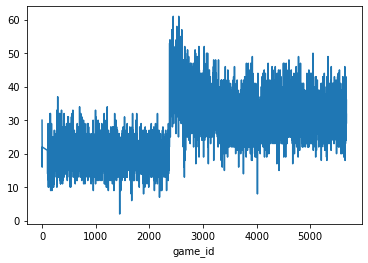

In [85]:
short.groupby("game_id").size().plot()

<AxesSubplot:>

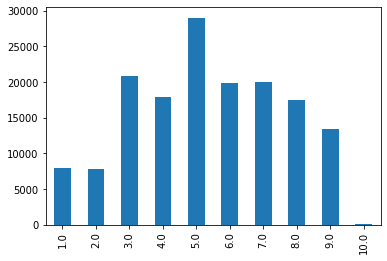

In [86]:
(short.step - short.queued_at).value_counts().sort_index().plot.bar()

In [87]:
short.head()

,type,player,step,queued_at,pos_score_data.posx,pos_score_data.posy,pos_score_data.dnet,pos_score_data.view,pos_score_data.dopp,pos_score_data.score,eval_data.pass_error,eval_data.pass_error_diff,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.pass_distance,eval_data.opp_dist_to_line,eval_data.opp_dist_to_active,eval_data.prb_success,target,game_id
0,SHORT_PASS_ATTEMPT,6,317,314.0,-0.231360,-0.000000,1.231360,0.000000,0.100000,18.411453,17.169074,0.597982,0.0,200.000000,0.685474,0.110258,0.100000,0.5,1,0
1,SHORT_PASS_ATTEMPT,9,452,445.0,0.363516,-0.017715,0.636731,0.114874,0.100000,34.538422,19.257111,23.000921,0.0,4.146959,0.418192,0.024255,0.046453,0.5,0,0
2,SHORT_PASS_ATTEMPT,6,577,574.0,-0.231360,-0.000000,1.231360,0.000000,0.100000,18.411453,17.114446,0.623181,0.0,200.000000,0.678937,0.110258,0.100000,0.5,1,0
3,SHORT_PASS_ATTEMPT,9,714,711.0,0.420839,0.002281,0.579165,0.126201,0.096700,36.585904,13.702714,7.208343,0.0,0.541776,0.457951,0.003606,0.100000,0.5,1,0
4,SHORT_PASS_ATTEMPT,7,1097,1094.0,-0.070630,0.103296,1.075602,0.000000,0.057158,20.829907,15.868716,11.641584,0.0,30.398112,0.265921,0.019971,0.023845,0.5,1,0


In [88]:
short.describe()

,player,step,queued_at,pos_score_data.posx,pos_score_data.posy,pos_score_data.dnet,pos_score_data.view,pos_score_data.dopp,pos_score_data.score,eval_data.pass_error,eval_data.pass_error_diff,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.pass_distance,eval_data.opp_dist_to_line,eval_data.opp_dist_to_active,eval_data.prb_success,target,game_id
count,154308.000000,154308.00000,154308.000000,154308.000000,154308.000000,154308.000000,154308.000000,154308.000000,154308.000000,154308.000000,154308.000000,154308.0,154308.000000,154308.000000,1.543080e+05,154308.000000,154308.000000,154308.000000,154308.000000
mean,6.135255,1470.13197,1464.801358,0.056366,0.010655,0.952820,0.077467,0.075308,26.964069,11.373395,20.414456,0.0,24.245972,0.254860,2.348447e-02,0.037600,0.736127,0.747667,3174.937560
std,3.281550,874.93648,874.925182,0.427529,0.115125,0.422762,0.070832,0.023373,7.559750,4.779247,21.101404,0.0,34.601756,0.133063,2.607974e-02,0.026857,0.075199,0.434353,1535.812772
min,0.000000,13.00000,10.000000,-1.046492,-0.410414,0.013592,0.000000,0.000548,11.356535,0.044583,0.000363,0.0,0.000553,0.000478,2.429101e-07,0.000046,0.386427,0.000000,0.000000
25%,3.000000,707.00000,702.000000,-0.050757,-0.051776,0.708776,0.036053,0.057201,21.693425,7.659451,4.580068,0.0,5.585784,0.155840,8.030743e-03,0.016370,0.687304,0.000000,2052.000000
50%,7.000000,1466.00000,1461.000000,0.129732,0.004319,0.877881,0.075758,0.078588,26.107984,11.347787,12.744350,0.0,13.143669,0.228997,1.687227e-02,0.030924,0.748569,1.000000,3247.000000
75%,9.000000,2226.00000,2221.000000,0.300033,0.074971,1.057186,0.102481,0.100000,31.157176,15.172257,29.848629,0.0,27.789391,0.332937,3.104782e-02,0.051456,0.775054,1.000000,4475.000000
max,10.000000,3000.00000,2999.000000,1.046794,0.402097,2.048542,2.810766,0.100000,50.000000,19.999905,132.424985,0.0,200.000000,0.911785,6.183829e-01,0.100000,0.960491,1.000000,5675.000000


In [91]:
# short["pos_score_data.view.val"] = short["pos_score_data.view"].clip(upper=1)

In [92]:
# short["eval_data.small_cone_angle"] = short["eval_data.small_cone_angle"].clip(upper=40)

In [99]:
short_pass_cols = [
     "step",
     "eval_data.pass_error",
     "eval_data.pass_error_diff",
     "pos_score_data.posx",
     "pos_score_data.dnet",
     "pos_score_data.view",
     "pos_score_data.dopp",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
     "eval_data.opp_dist_to_line",
     "eval_data.opp_dist_to_active",
     "eval_data.prb_success",
]

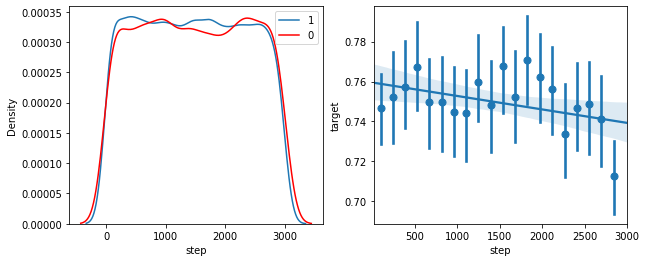

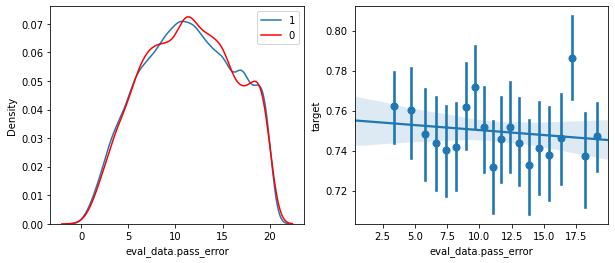

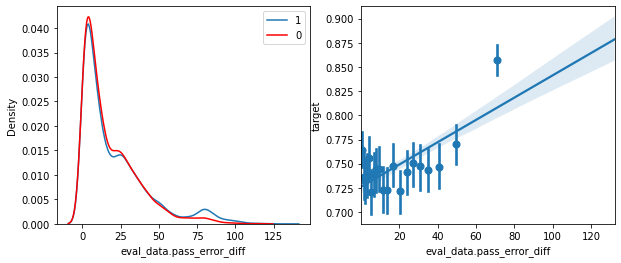

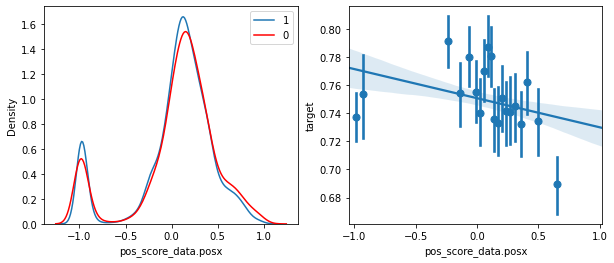

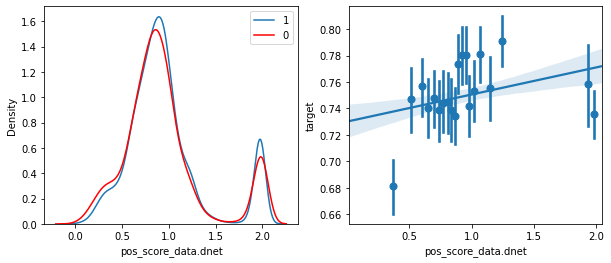

...

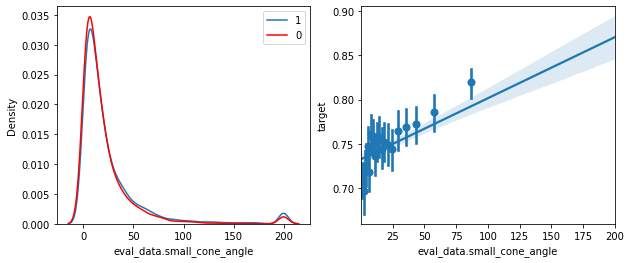

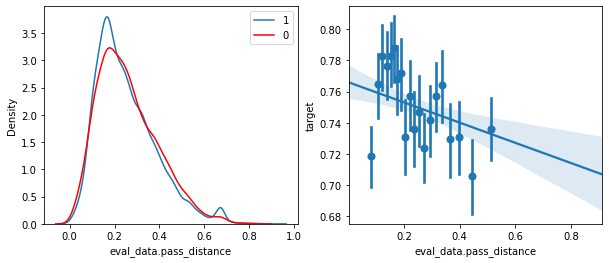

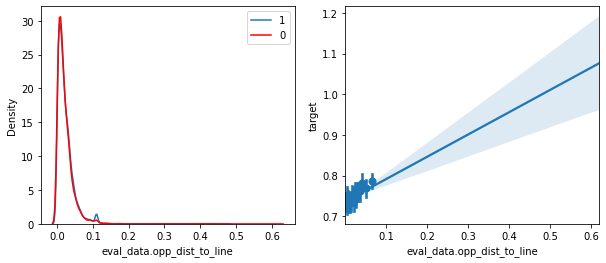

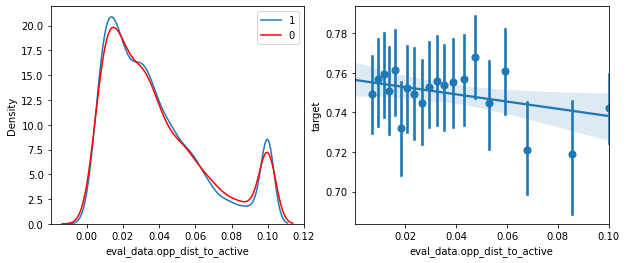

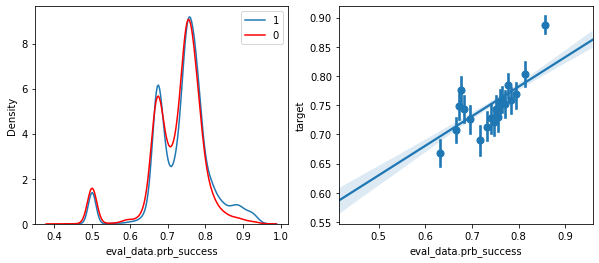

In [100]:
tmp = short.sample(30_000)
for col in short_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.target == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.target == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.target, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sm.OLS(short.success, sm.add_constant(short[short_pass_cols])).fit().summary()

In [ ]:
short_pass_cols = [
#      "step",
#      "eval_data.pass_error",
     "eval_data.pass_error_diff",
     "pos_score_data.posx",
     "pos_score_data.dnet",
     "pos_score_data.view",
     "pos_score_data.dopp",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
     "eval_data.opp_dist_to_line",
     "eval_data.opp_dist_to_active",
#      "eval_data.prb_success",
]

In [ ]:
sm.OLS(short.success, sm.add_constant(short[short_pass_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(short[short_pass_cols], short.success)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(short[short_pass_cols])[:, 1])

In [ ]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [ ]:
grid_search.best_estimator_.booster_.save_model("short_pass_model.txt")

In [ ]:
short_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [ ]:
short_pipe.fit(short[short_pass_cols], short.success)

In [ ]:
short_pipe.named_steps.ridgeclassifiercv.alpha_

In [ ]:
joblib.dump(short_pipe, "short_pass_model.pkl")

## Long pass data

In [ ]:
long = sim.make_long_pass_dataset()
long.shape

In [ ]:
long.groupby("game_id").size().plot()

In [ ]:
(long.step - long.queued_at).value_counts().sort_index().plot.bar()

In [ ]:
long.head()

In [ ]:
long.describe()

In [ ]:
long["pos_score_data.view.val"] = long["pos_score_data.view.val"].clip(upper=1)

In [ ]:
long_pass_cols = [
     "step",
     "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
     "eval_data.prb_success",
]

In [ ]:
tmp = long.sample(30_000)
for col in long_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.success == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.success == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.success, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

In [ ]:
long_pass_cols = [
#      "step",
#      "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
#      "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
#      "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
#      "eval_data.prb_success",
]

In [ ]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 101, 10)),
    "num_leaves": [5, 10, 20, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(long[long_pass_cols], long.success)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(long[long_pass_cols])[:, 1])

In [ ]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [ ]:
grid_search.best_estimator_.booster_.save_model("long_pass_model.txt")

In [ ]:
long_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [ ]:
long_pipe.fit(long[long_pass_cols], long.success)

In [ ]:
long_pipe.named_steps.ridgeclassifiercv.alpha_

In [ ]:
joblib.dump(long_pipe, "long_pass_model.pkl")

## Handling data

In [ ]:
handle = sim.make_handling_dataset()
handle.shape

In [ ]:
handle.groupby("game_id").size().plot()

In [ ]:
handle.groupby("game_id").size().tail(500)

In [ ]:
handle.head()

In [ ]:
handle.describe()

In [ ]:
handle["pos_score_data.view.val"] = handle["pos_score_data.view.val"].clip(upper=1)

In [ ]:
handle_cols = [
     "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
     "eval_data.prb_failure",
]

In [ ]:
tmp = handle.sample(30_000)
for col in handle_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.failure == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.failure == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.failure, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [ ]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

In [ ]:
handle_cols = [
#      "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
#      "eval_data.prb_failure",
]

In [ ]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(handle[handle_cols], handle.failure)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(handle[handle_cols])[:, 1])

In [ ]:
grid_search.best_estimator_.booster_.save_model("handle_model.txt")

In [ ]:
handle_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [ ]:
handle_pipe.fit(handle[handle_cols], handle.failure)

In [ ]:
handle_pipe.named_steps.ridgeclassifiercv.alpha_

In [ ]:
joblib.dump(handle_pipe, "handle_model.pkl")

## Position score data

In [72]:
pos_score = models.make_position_score_dataset()
pos_score.shape

100%|██████████| 5676/5676 [00:02<00:00, 2312.82it/s]


(4252858, 10)

In [73]:
pos_score["pred"] = np.random.uniform(size=len(pos_score))

In [74]:
pos_score.head()

,posx,posy,dnet,view,dopp,score,type,step,reward,game_id,pred
0,-0.194609,0.000354,1.194609,0.00000,0.100000,19.053777,ACTIVE_POS_SCORE,13,0,0,0.052438
1,-0.188593,0.000598,1.188593,0.00000,0.100000,19.162730,ACTIVE_POS_SCORE,14,0,0,0.554359
2,-0.181206,0.000883,1.181206,0.00000,0.100000,19.297949,ACTIVE_POS_SCORE,15,0,0,0.497491
3,-0.173468,0.001180,1.173469,0.00000,0.088995,19.578868,ACTIVE_POS_SCORE,16,0,0,0.116153
4,-0.055149,0.046784,1.056185,0.06441,0.015264,20.488624,ACTIVE_POS_SCORE,32,0,0,0.574104


In [75]:
pos_score["posy"] = pos_score["posy"].abs()

pos_score["logx"] = np.log10(pos_score["posx"] + 2.0)
pos_score["posy2"] = pos_score["posy"] ** 2
pos_score["dnet2"] = pos_score["dnet"] ** 2
pos_score["view2"] = pos_score["view"] ** 2
pos_score["dopp2"] = pos_score["dopp"] ** 2

In [76]:
X_cols = [
    "posx",
    "posy",
    "dnet",
    "view",
    "dopp",
    "logx",
    "posy2",
    "dnet2",
    "view2",
    "dopp2",
]

In [78]:
from IPython.display import clear_output, display
from ipywidgets import Output

In [79]:
mean_pred = [np.nan]
median_pred = [np.nan]
std_pred = [np.nan]

out = Output()
display(out)

for _ in tqdm(range(500)):
    
    out.clear_output(wait=True)
    
    pos_score["target"] = (pos_score.reward * 50.0 + pos_score.pred.shift(-1) * 0.99).clip(lower=0.0, upper=50.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = sm.add_constant(pos_score[X_cols])
    mask = pos_score.target.notna()
    ols_model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = ols_model.predict(X)
    
    mean_pred.append(pos_score.pred.mean())
    median_pred.append(pos_score.pred.median())
    std_pred.append(pos_score.pred.std())
    f, axes = plt.subplots(1, 3, figsize=(12, 3))
    pd.Series(mean_pred).plot(ax=axes[0])
    pd.Series(median_pred).plot(ax=axes[1])
    pd.Series(std_pred).plot(ax=axes[2])
    
    with out:
        plt.show()

Output()

KeyboardInterrupt: 

In [80]:
ols_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                 6.293e+06
Date:                Sun, 08 Nov 2020   Prob (F-statistic):               0.00
Time:                        22:14:58   Log-Likelihood:            -1.0052e+07
No. Observations:             4247181   AIC:                         2.010e+07
Df Residuals:                 4247170   BIC:                         2.010e+07
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        307.0344      0.163   1885.375      0.000     306.715     307.354
posx         -79.6127      0.109   -729.846      0.000     -79.826     -79.399
posy           3.1817      0.040     79.218      0.000       3.103       3.260
dnet        -170.8434      0.087  -1974.060      0.000    -171.013    -170.674
view          15.2257      0.032    480.698      0.000      15.164      15.288
dopp          87.8210      0.196    448.022      0.000      87.437      88.205
logx        -366.6045      0.501   -732.161      0.000    -367.586    -365.623
posy2         80.0971      0.127    632.442      0.000      79.849      80.345
dnet2         -8.1232      0.034   -239.108      0.000      -8.190      -8.057
view2         -6.6027      0.026   -257.782      0.000      -6.653      -6.553
dopp2       -528.3954      1.872   -282.209      0.000    -532.065    -524.726
==============================================================================
Omnibus:                  1969006.179   Durbin-Watson:                   1.486
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        311905854.853
Skew:                          -1.174   Prob(JB):                         0.00
Kurtosis:                      44.917   Cond. No.                     3.05e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [81]:
ols_model.params.tolist()

[307.0343597796267,
 -79.6126832391322,
 3.18168640712528,
 -170.84343408637883,
 15.225679584757794,
 87.82098757983785,
 -366.6045294401938,
 80.09708098058961,
 -8.123204679740764,
 -6.602709094607595,
 -528.3954428038661]

In [ ]:
sns.displot(pos_score.pred)

In [ ]:
sns.jointplot(x=pos_score.pred, y=pos_score["total.score"])

In [ ]:
X_cols = [
    "posx.val",
    "dnet.val",
    "view.val",
    "dopp.val",
]

In [ ]:
for _ in tqdm(range(1_000)):
    pos_score["target"] = (pos_score.reward * 50.0 + pos_score.pred.shift(-1) * 0.99).clip(lower=0.0, upper=50.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = pos_score[X_cols]
    mask = pos_score.target.notna()
    lgb_model = LGBMRegressor().fit(X[mask], pos_score.target[mask])
#     model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = lgb_model.predict(X)

In [ ]:
sns.displot(pos_score.pred)

In [ ]:
sns.jointplot(x=pos_score.pred, y=pos_score["total.score"])

In [ ]:
lgb_model.booster_.save_model("position_model.txt")

# Ball physics

In [ ]:
stop

In [ ]:
ball_cols = [c for c in df.columns if c.startswith("ball")]
df[[c + "_diff" for c in ball_cols]] = df[ball_cols].diff().shift(-1)
df["ball_in_air"] = df.ball_pos_z > 0.7
df["ball_vel"] = (df.ball_dir_x**2 + df.ball_dir_y**2 + df.ball_dir_z**2) ** 0.5

In [ ]:
df.head()

In [ ]:
df[df.ball_in_air].head(30)

In [ ]:
df.ball_pos_z.plot(figsize=(15, 5))

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_pos_z_diff",
#     c="ball_vel",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
ax.set_ylim(-1, 1)
abline(ax, 1, -0.05)

In [ ]:
df[df.ball_in_air & (df.ball_dir_z != 0.0) & (df.ball_dir_z_diff > 1)]
df[(df.step >= 1660) & (df.step <= 1670)]

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_dir_z_diff",
#     c="ball_pos_z",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
abline(ax, -0.01, -0.08)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_pos_x_diff")
ax.plot([-0.1, 0.1], [-0.1, 0.1])

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_dir_x_diff")
ax.plot([-0.04, 0.04], [-0.04, 0.04])
abline(ax, -0.05, 0)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_y != 0.0)].plot.scatter(x="ball_dir_y", y="ball_dir_y_diff")
ax.plot([-0.01, 0.01], [-0.01, 0.01])
abline(ax, -0.05, 0)

In [ ]:
def abline(ax, slope, intercept):
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--')

In [ ]:
(df.ball_pos_z_diff - df.ball_dir_z).mean()